In [1]:
!pip install ultralytics
!pip install roboflow
!pip install pyyaml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 792.7/792.7 kB 5.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [2]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo checks

Ultralytics YOLOv8.2.39 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/78.2 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.00GHz
CUDA                12.1

numpy               ✅ 1.25.2<2.0.0
matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.3.0+cu121>=1.8.0
torchvision         ✅ 0.18.0+cu121>=0.9.0
tqdm                ✅ 4.66.4>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
pandas              ✅ 2.0.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0
ultralytics-thop    ✅ 2.0.0>=2.0.0


In [3]:
from roboflow import Roboflow
rf = Roboflow(api_key="u9mHiZEkkYBJcbqxATk8")
project = rf.workspace("muhammadmoin-y1qrz").project("retail-store-axhqk")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.39, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Retail-Store-1 in yolov8:: 100%|██████████| 2138/2138 [00:00<00:00, 3377.79it/s]


In [4]:
import yaml

with open(f'{dataset.location}/data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['test'] = '/content/Retail-Store-1/test/images'
data['train'] = '/content/Retail-Store-1/train/images'
data['val'] = '/content/Retail-Store-1/valid/images'

with open('/content/Retail-Store-1/data.yaml', 'w') as file:
    yaml.safe_dump(data, file, default_flow_style=False)

print("File updated successfully!")

File updated successfully!


In [5]:
model = YOLO('yolov8m.pt')
num_epochs = 20

results = model.train(data=f'{dataset.location}/data.yaml', epochs=num_epochs, imgsz=640, save=True)

100%|██████████| 49.7M/49.7M [00:00<00:00, 209MB/s]


Ultralytics YOLOv8.2.39 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Retail-Store-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

100%|██████████| 755k/755k [00:00<00:00, 18.4MB/s]


Overriding model.yaml nc=80 with nc=27

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

100%|██████████| 6.23M/6.23M [00:00<00:00, 110MB/s]
Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)


AMP: checks passed ✅


train: Scanning /content/Retail-Store-1/train/labels... 856 images, 0 backgrounds, 0 corrupt: 100%|██████████| 856/856 [00:00<00:00, 1907.58it/s]

train: New cache created: /content/Retail-Store-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/Retail-Store-1/valid/labels... 96 images, 0 backgrounds, 0 corrupt: 100%|██████████| 96/96 [00:00<00:00, 1006.38it/s]

val: New cache created: /content/Retail-Store-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000323, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.29G       1.36      3.142      1.587         44        640: 100%|██████████| 54/54 [00:35<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.07it/s]

                   all         96        390      0.693      0.306      0.344      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.21G      1.287      1.991      1.492         54        640: 100%|██████████| 54/54 [00:30<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]

                   all         96        390      0.742       0.42      0.537      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.09G      1.282      1.737      1.498         37        640: 100%|██████████| 54/54 [00:29<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.32it/s]

                   all         96        390      0.683      0.599      0.654      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.19G      1.251       1.53      1.465         33        640: 100%|██████████| 54/54 [00:29<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]

                   all         96        390      0.696      0.659      0.763      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20       7.2G      1.233       1.45       1.46         26        640: 100%|██████████| 54/54 [00:29<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.33it/s]

                   all         96        390      0.665      0.663      0.717       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      7.19G      1.232      1.356      1.464         68        640: 100%|██████████| 54/54 [00:29<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

                   all         96        390      0.738      0.634      0.735      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.19G      1.175      1.276      1.423         35        640: 100%|██████████| 54/54 [00:29<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.04it/s]

                   all         96        390      0.827      0.687      0.806      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.18G      1.139      1.181        1.4         29        640: 100%|██████████| 54/54 [00:29<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         96        390      0.817      0.737      0.824      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.22G      1.123      1.088      1.381         48        640: 100%|██████████| 54/54 [00:28<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.45it/s]

                   all         96        390      0.814      0.749      0.812      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.19G      1.071     0.9667      1.341         84        640: 100%|██████████| 54/54 [00:28<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

                   all         96        390      0.883      0.756      0.856      0.577


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      7.21G      1.075     0.9576      1.388         15        640: 100%|██████████| 54/54 [00:31<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all         96        390      0.859      0.771      0.853      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      7.17G      1.047     0.8492      1.348         42        640: 100%|██████████| 54/54 [00:29<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.29it/s]

                   all         96        390       0.88      0.726      0.869      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20       7.2G      1.004     0.7694      1.309         20        640: 100%|██████████| 54/54 [00:28<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

                   all         96        390      0.887       0.83       0.88      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20       7.2G     0.9853     0.7245      1.315         31        640: 100%|██████████| 54/54 [00:29<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.30it/s]

                   all         96        390      0.906      0.779      0.883      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      7.17G      0.965     0.6629      1.281         28        640: 100%|██████████| 54/54 [00:32<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         96        390       0.85      0.829      0.872      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      7.19G     0.9055     0.6051      1.237         25        640: 100%|██████████| 54/54 [00:30<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

                   all         96        390      0.848      0.854      0.883      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      7.19G     0.8875     0.5793      1.222         25        640: 100%|██████████| 54/54 [00:29<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         96        390      0.754      0.849      0.867      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      7.19G     0.8454     0.5258      1.196         20        640: 100%|██████████| 54/54 [00:29<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         96        390      0.843      0.859      0.881      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      7.19G     0.8161      0.501      1.184         29        640: 100%|██████████| 54/54 [00:29<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         96        390      0.884      0.853      0.881      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      7.18G     0.7938     0.4639      1.146         23        640: 100%|██████████| 54/54 [00:30<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         96        390       0.87      0.861      0.887      0.644



20 epochs completed in 0.209 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.1MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.1MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.39 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25855393 parameters, 0 gradients, 78.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.57s/it]


                   all         96        390       0.87      0.861      0.887      0.644
                Apples          4          4      0.884       0.75      0.912      0.622
                   Bun          4          7      0.778          1      0.995      0.619
               Cabbage          2          2      0.789          1      0.995      0.698
            Cold Drink          1          1          1          0          0          0
             Dry Fruit          1          1       0.94          1      0.995      0.497
                  Eggs          1          1      0.408          1      0.995      0.796
           Green Seeds          2          2      0.789          1      0.995      0.723
                  Milk          1          1      0.695          1      0.995      0.895
                   Oil          3          3      0.842          1      0.995      0.632
             Pineapple          2          2      0.823          1      0.995      0.729
                Snack

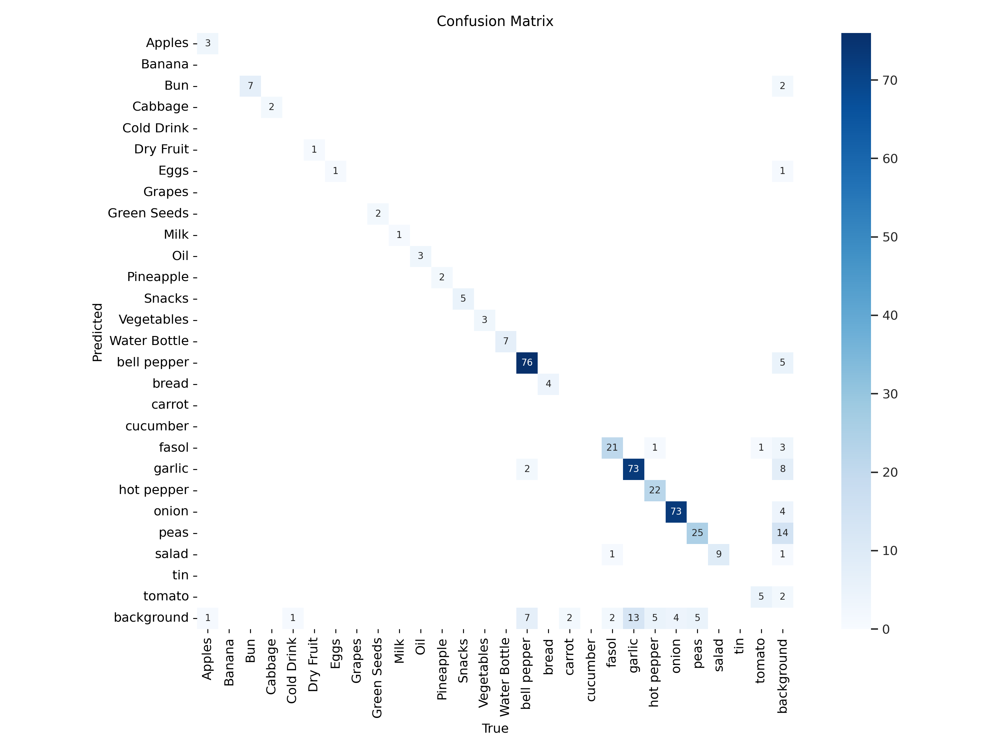

In [6]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

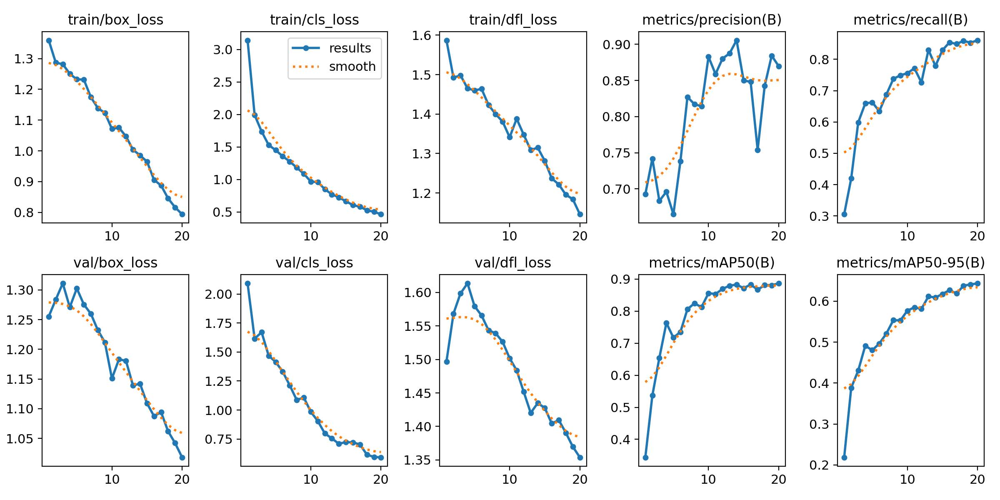

In [7]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [8]:
val_results = model.val(data=f'{dataset.location}/data.yaml',
                        save=True)

Ultralytics YOLOv8.2.39 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25855393 parameters, 0 gradients, 78.8 GFLOPs


val: Scanning /content/Retail-Store-1/valid/labels.cache... 96 images, 0 backgrounds, 0 corrupt: 100%|██████████| 96/96 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.04s/it]


                   all         96        390       0.87      0.861      0.887      0.642
                Apples          4          4      0.881       0.75      0.912      0.607
                   Bun          4          7      0.778          1      0.995      0.593
               Cabbage          2          2      0.788          1      0.995      0.698
            Cold Drink          1          1          1          0          0          0
             Dry Fruit          1          1       0.94          1      0.995      0.497
                  Eggs          1          1      0.407          1      0.995      0.796
           Green Seeds          2          2      0.788          1      0.995      0.723
                  Milk          1          1      0.694          1      0.995      0.895
                   Oil          3          3      0.842          1      0.995      0.632
             Pineapple          2          2      0.822          1      0.995      0.729
                Snack

In [9]:
os.makedirs('runs/detect/val', exist_ok=True)
os.rename('runs/detect/train2', 'runs/detect/val')

In [10]:
source_path = f'{dataset.location}/test/images'
data_path = f'{dataset.location}/data.yaml'

results = model(source_path, conf=0.5, data=data_path, save=True)


image 1/111 /content/Retail-Store-1/test/images/-10_jpg.rf.615cf8b0a17999d0092f69280a51da03.jpg: 640x640 5 garlics, 37.2ms
image 2/111 /content/Retail-Store-1/test/images/-11_jpg.rf.80671bda8eacbd17b103ba4af0cc0199.jpg: 640x640 5 onions, 37.2ms
image 3/111 /content/Retail-Store-1/test/images/-11_jpg.rf.b9d9e5829f524ccb1e197fbe937793a5.jpg: 640x640 1 bell pepper, 37.1ms
image 4/111 /content/Retail-Store-1/test/images/-13_jpg.rf.850ef84f30dcf451e5b7974f19a07b14.jpg: 640x640 5 onions, 35.5ms
image 5/111 /content/Retail-Store-1/test/images/-14_jpg.rf.38ab548b652a1ee23065a4b59fcef577.jpg: 640x640 4 bell peppers, 34.8ms
image 6/111 /content/Retail-Store-1/test/images/-14_jpg.rf.3a7b2b9e7399d83a442f345974d06806.jpg: 640x640 1 salad, 35.0ms
image 7/111 /content/Retail-Store-1/test/images/-16_jpg.rf.bdd919add97f7ab691b2f4a46b579243.jpg: 640x640 1 bell pepper, 33.0ms
image 8/111 /content/Retail-Store-1/test/images/-17_jpg.rf.1130f8d4ad464a0e05cdfc6dca36fde0.jpg: 640x640 4 peass, 24.6ms
image 9/

In [11]:
os.makedirs('runs/detect/predict', exist_ok=True)
os.rename('runs/detect/train2', 'runs/detect/predict')

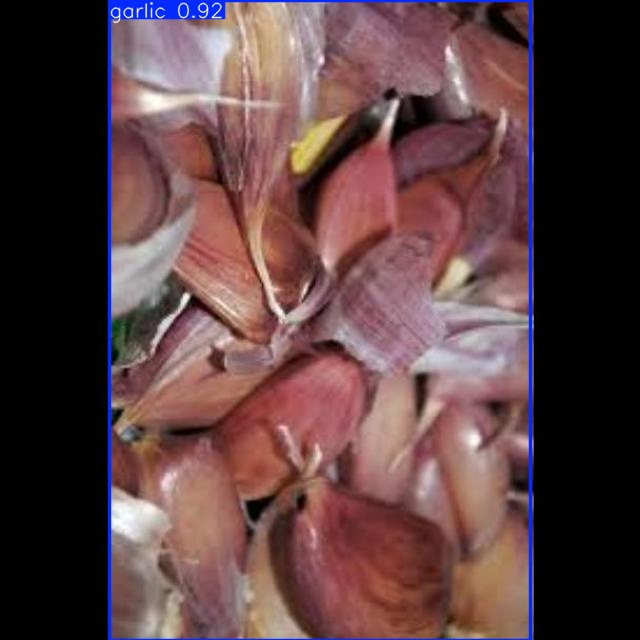

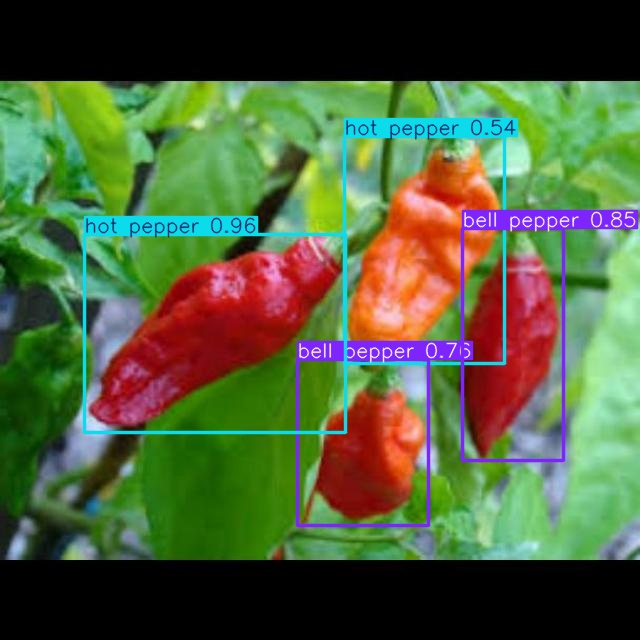

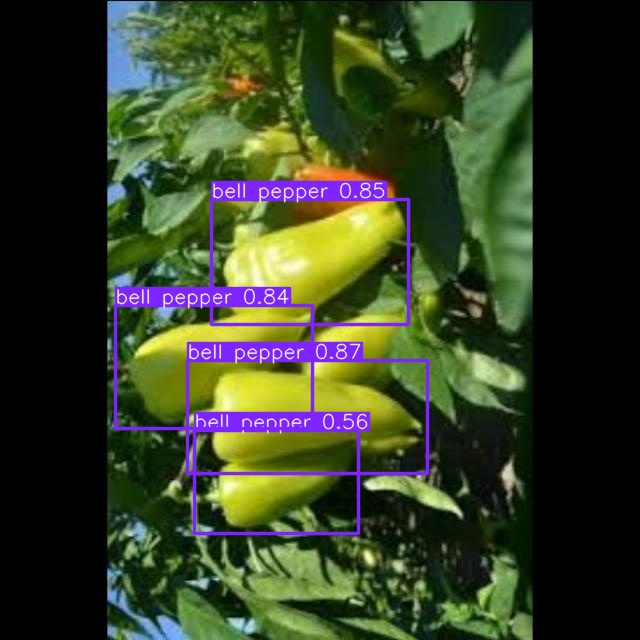

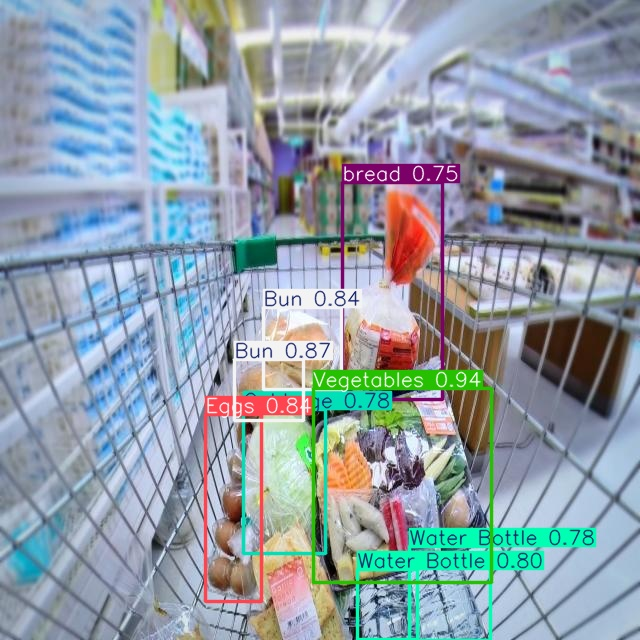

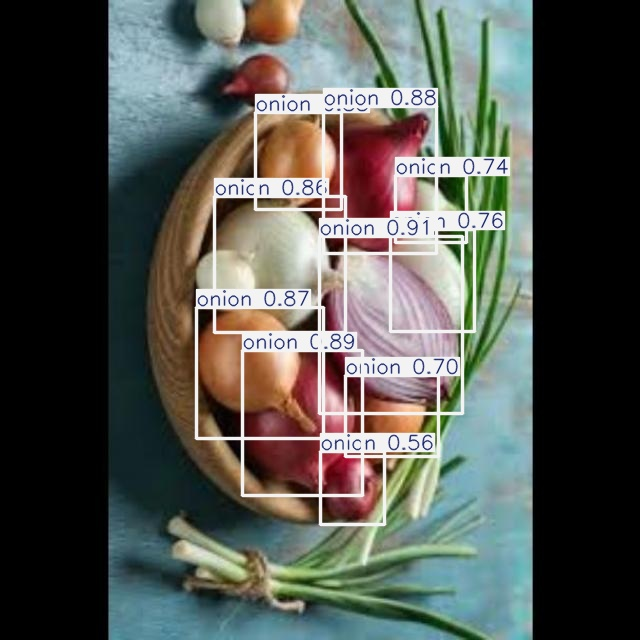

...

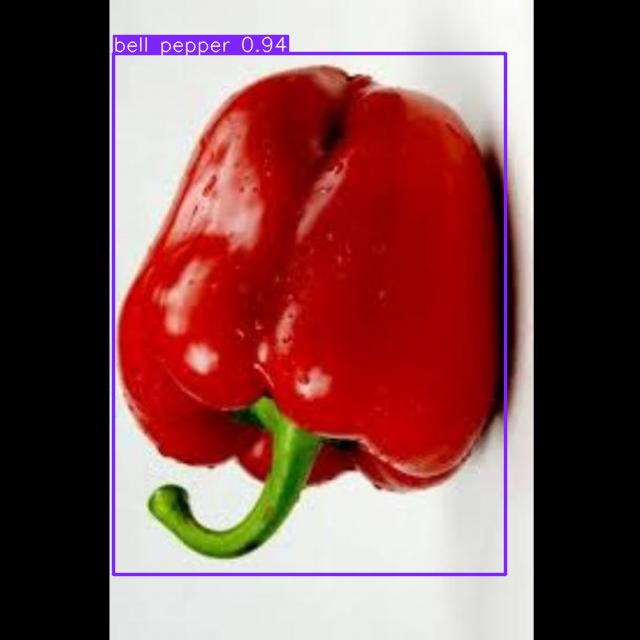

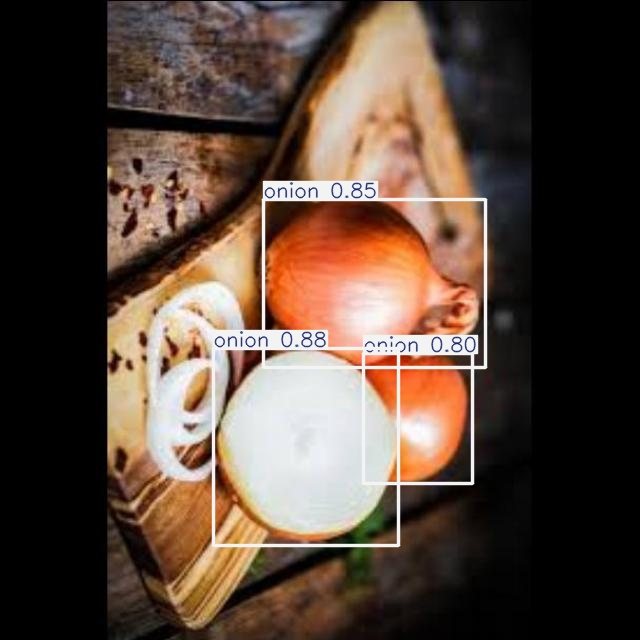

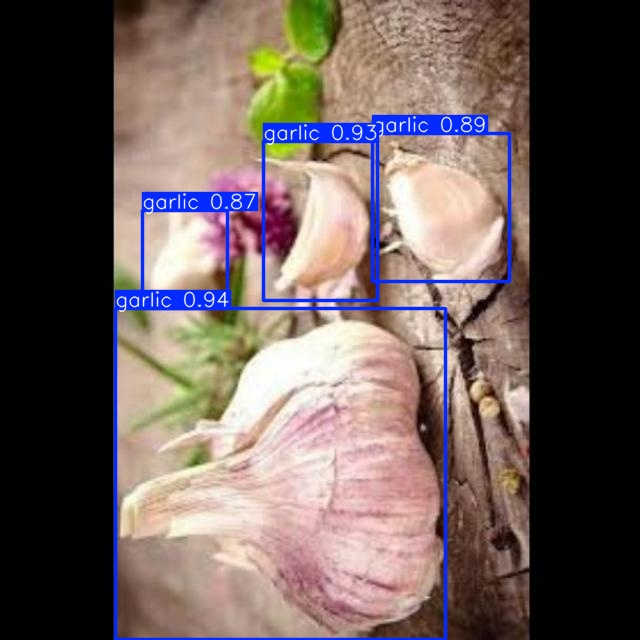

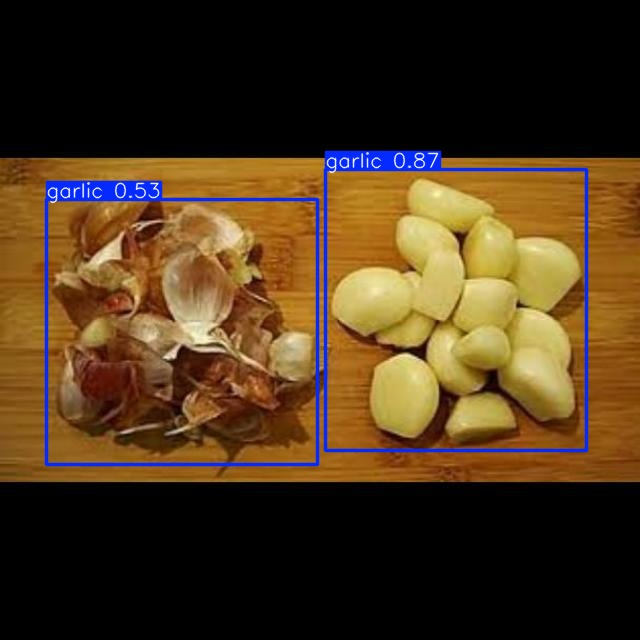

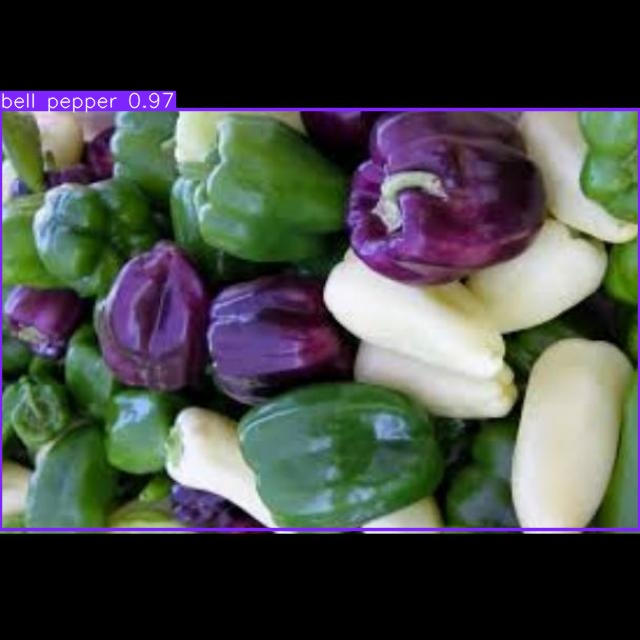

In [12]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path, height=600))
  print("\n")



---



In [13]:
res = model('/content/Retail-Store-1/test/images/Retail-Cart-fast_mov-39_jpg.rf.1c6b1c8b8009a0aa505ccb3c96ebec22.jpg',
            conf=0.5,
            data=data_path)


image 1/1 /content/Retail-Store-1/test/images/Retail-Cart-fast_mov-39_jpg.rf.1c6b1c8b8009a0aa505ccb3c96ebec22.jpg: 640x640 2 Buns, 1 Cabbage, 1 Eggs, 1 Grapes, 1 Vegetables, 2 Water Bottles, 25.6ms
Speed: 4.3ms preprocess, 25.6ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


In [14]:
def get_list_of_detected_items(results):
  detected_items = set()
  for result in results:
    for box in result.boxes:
      # possible to bound list of items by confidence of prediction
      # detected_items.append({
      #     'class': result.names[box.cls.item()],
      #     'confidence': box.conf.item(),
      #     'coordinates': box.xyxy.tolist()
      # })
      detected_items.add(result.names[box.cls.item()])
  return list(detected_items)

get_list_of_detected_items(res)

['Vegetables', 'Bun', 'Grapes', 'Cabbage', 'Water Bottle', 'Eggs']